In [26]:
import os
import re
import sys
from pathlib import Path

import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import skimage
import squidpy as sq
from skimage import io
from tqdm.notebook import tqdm, trange

sc.settings.verbosity = 3

import anndata as ad
import cv2
import matplotlib
import seaborn as sns
from skimage import exposure, measure, morphology


In [27]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [28]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import utils as my_utils

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [29]:
adata_path = data_dir / 'metadata' / f"combined_semi_final.h5ad"
adata = ad.read_h5ad(adata_path)


In [30]:
all_donor = [
    "LN Donor A",
    "LN Donor E",
    "INT Donor B",
    "INT Donor E",
    "TS Donor A",
    "TS Donor E",
]


# Get masks

In [31]:
# Read mask image
def get_masks(mask_folder):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition =  name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks

In [32]:
masks_follicle = get_masks(data_dir / 'masks_follicle')


# Comparison follicle cell type across tissue

In [33]:
adatas = []
for d in all_donor:
    adata_d = adata[adata.obs.Dataset == d]
    mask_d = masks_follicle[d]
    centroids = adata_d.obsm['spatial'].astype(int)
    x_max, y_max = centroids.max(axis=0)
    
    # Pad mask if needed
    pad_bottom = int(np.ceil(y_max)) - mask_d.shape[0]+1
    pad_right = int(np.ceil(x_max)) - mask_d.shape[1]+1
    pad_bottom = 0 if pad_bottom < 0 else pad_bottom
    pad_right = 0 if pad_right < 0 else pad_right
    mask_d_padded = cv2.copyMakeBorder(mask_d, 0, pad_bottom, 0, pad_right, 
                                       cv2.BORDER_CONSTANT, value=0)
    
    # Extract follicle region
    indices_foll = mask_d_padded[centroids[:,1],centroids[:,0]] > 0
    adata_d_foll = adata_d[indices_foll]
    adatas.append(adata_d_foll)


In [34]:
adata_foll = ad.concat(adatas)

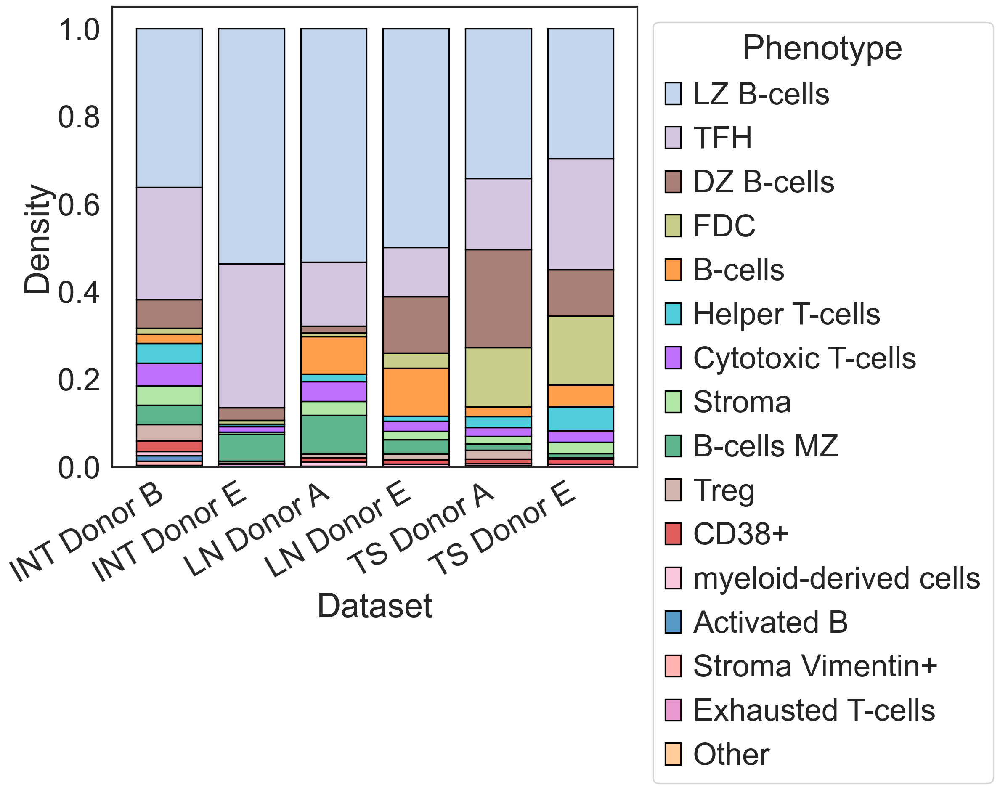

In [35]:
# Per Tissue phenotype composition

var = 'Phenotype' 
df_cluster = pd.DataFrame()
df_cluster["Dataset"] = adata_foll.obs['Dataset'].tolist()
df_cluster["Dataset"] = df_cluster["Dataset"].astype(str).astype('category')
df_cluster[var] = adata_foll.obs['Phenotype'].tolist()
df_cluster_count = df_cluster.value_counts().to_frame('counts').reset_index()
df_cluster_count['Density'] = df_cluster_count.groupby("Dataset")["counts"].apply(lambda x: x / x.sum())

# Get cluster color matching heatmap
cluster_label_order = adata.uns[f'dendrogram_{var}']['categories_ordered']

colors = adata.uns[f"{var}_colors"]
labels = adata.obs[var].cat.categories.tolist()
colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v/255 for k,v in zip(labels, colors_rgb)}

# plot stacked barplot
sns.set_style('white')
with sns.plotting_context('talk', font_scale=2):
    fig, ax = plt.subplots(figsize=(10, 9))
    ax = sns.histplot(data=df_cluster_count, x="Dataset" , hue=var, weights='Density', discrete=True, multiple='stack', shrink=0.8, palette=colors_rgb_dict, edgecolor='k',)
    ax.set_ylabel('Density')

    # Fix the legend so it's not on top of the bars.
    legend = ax.get_legend()
    legend.set_bbox_to_anchor((1, 1))
    plt.xticks(rotation=30, ha='right')


In [36]:
from matplotlib.pyplot import rc_context

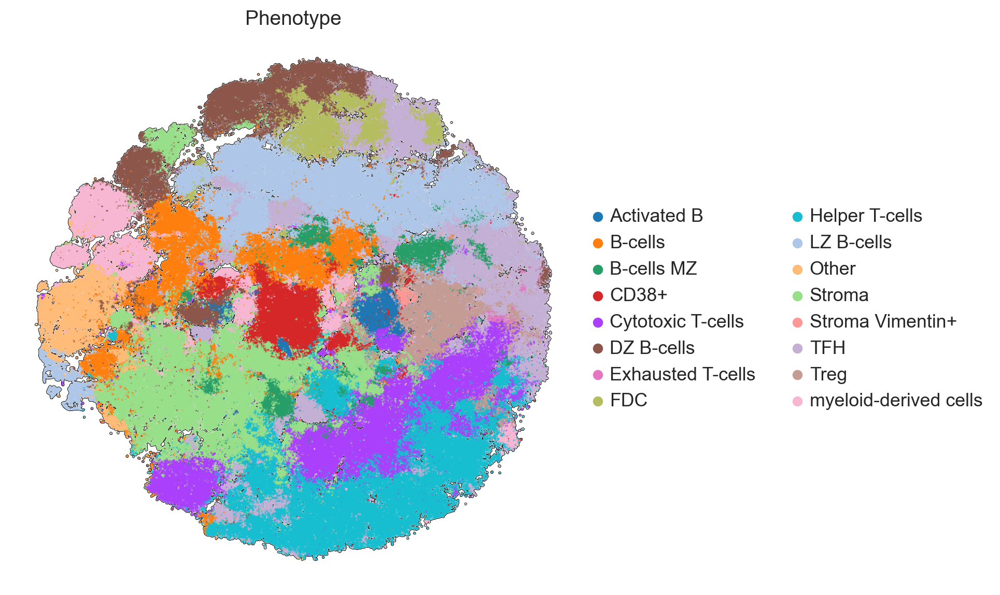

In [37]:
sc.set_figure_params(format='png')

with rc_context({'figure.figsize': (7, 7), 'figure.dpi': 100}):
    fig = sc.pl.tsne(adata, color=['Phenotype'], size=5, add_outline=True, frameon=False)

In [38]:
all_donor

['LN Donor A',
 'LN Donor E',
 'INT Donor B',
 'INT Donor E',
 'TS Donor A',
 'TS Donor E']

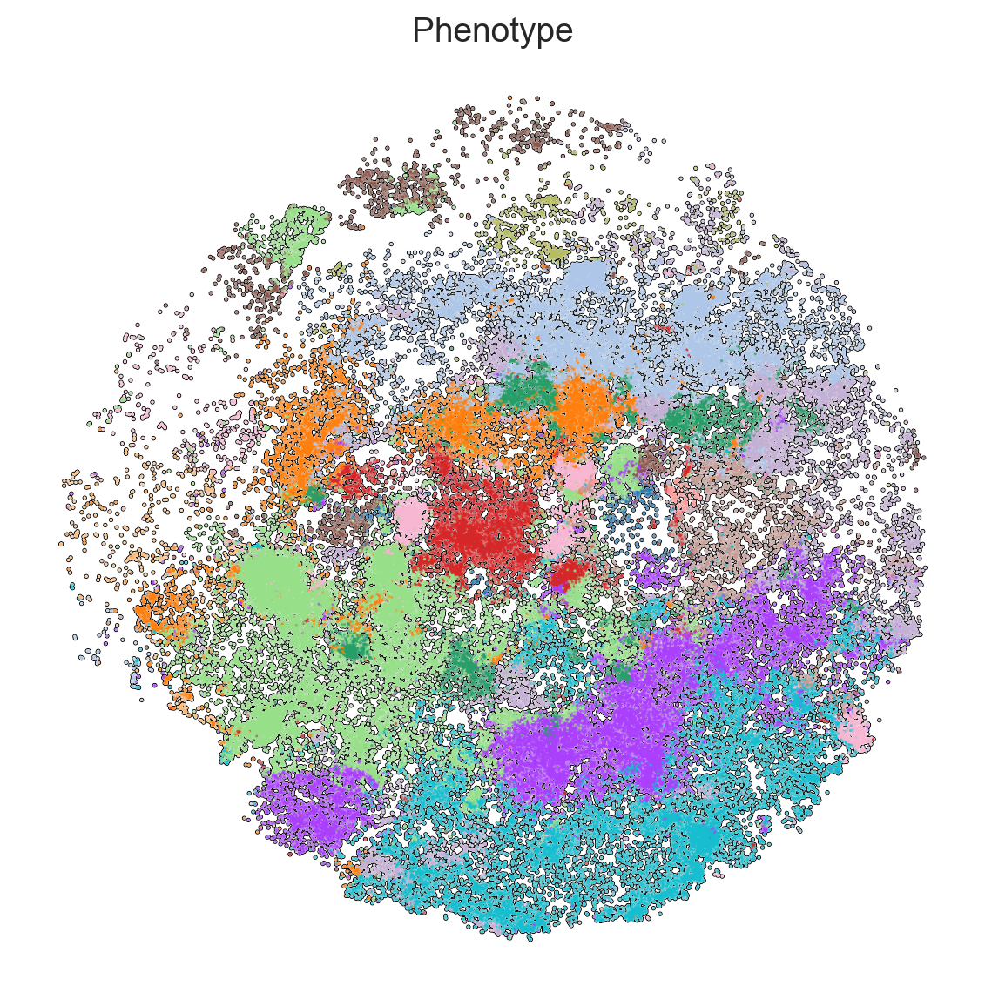

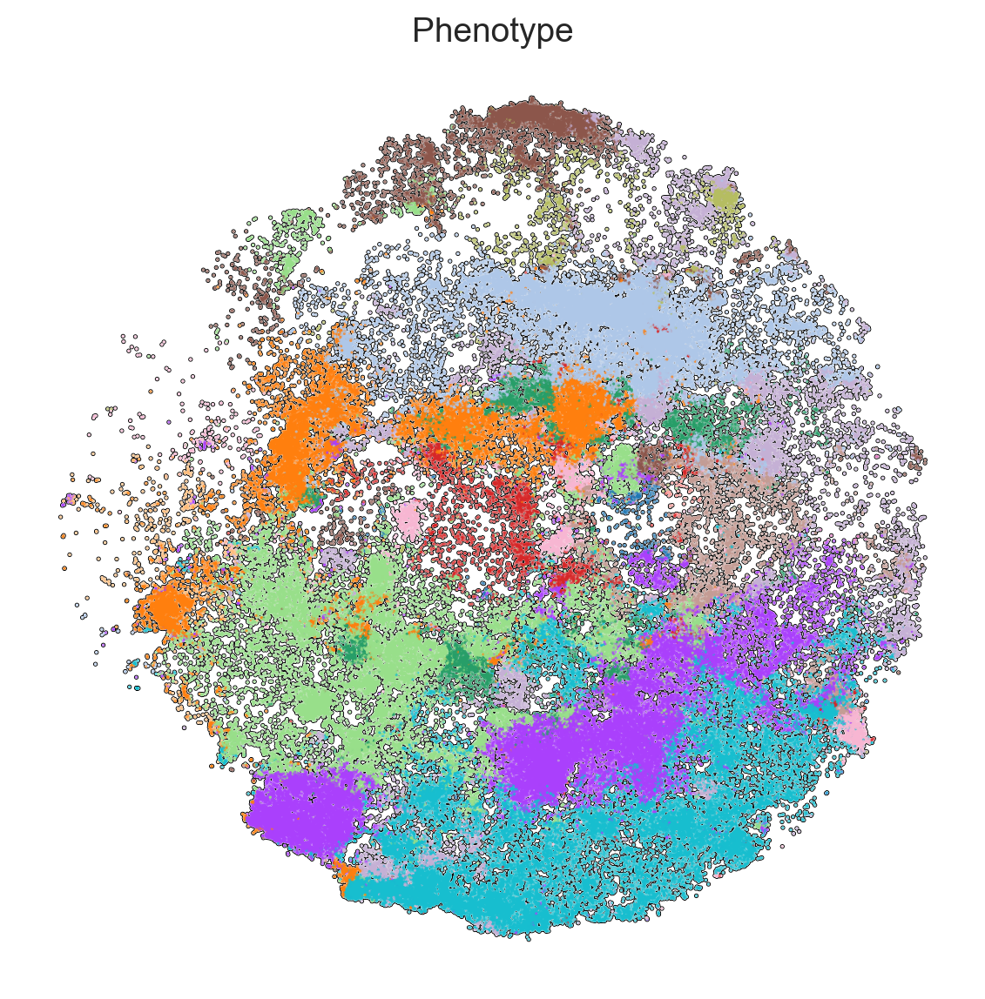

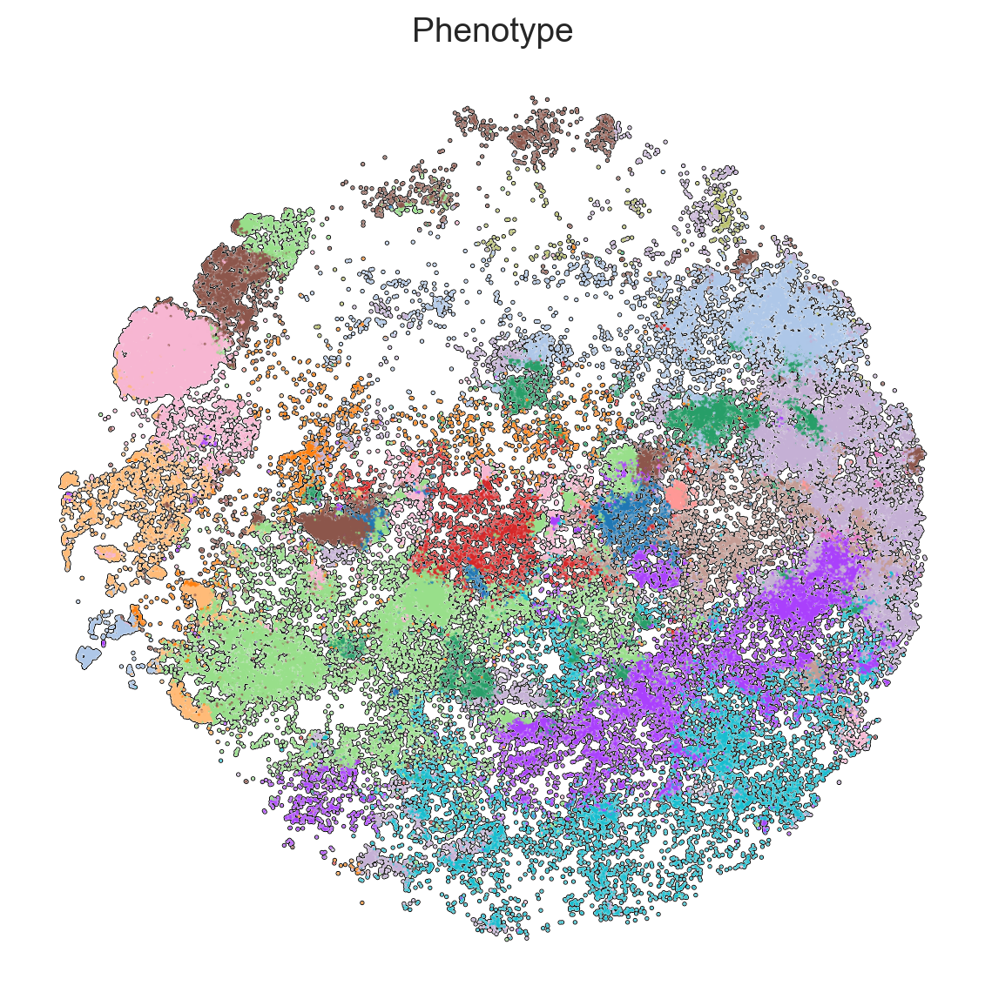

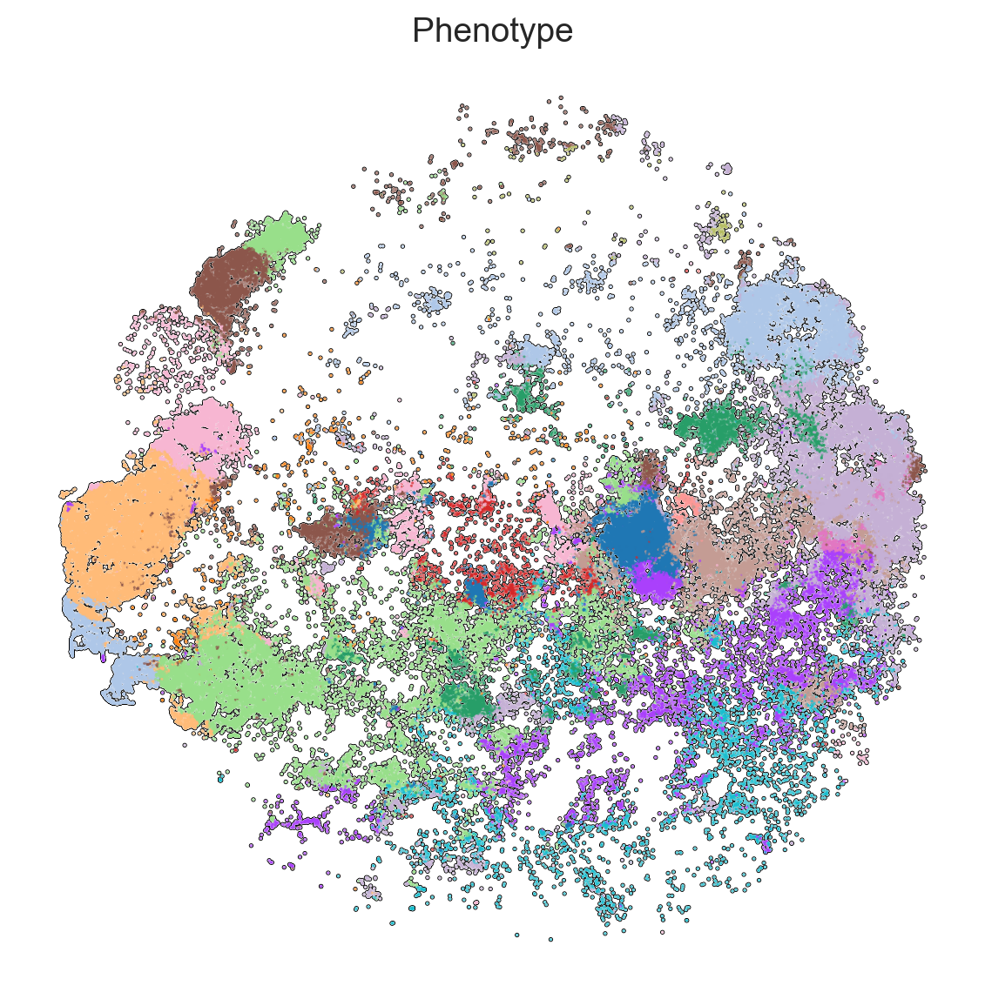

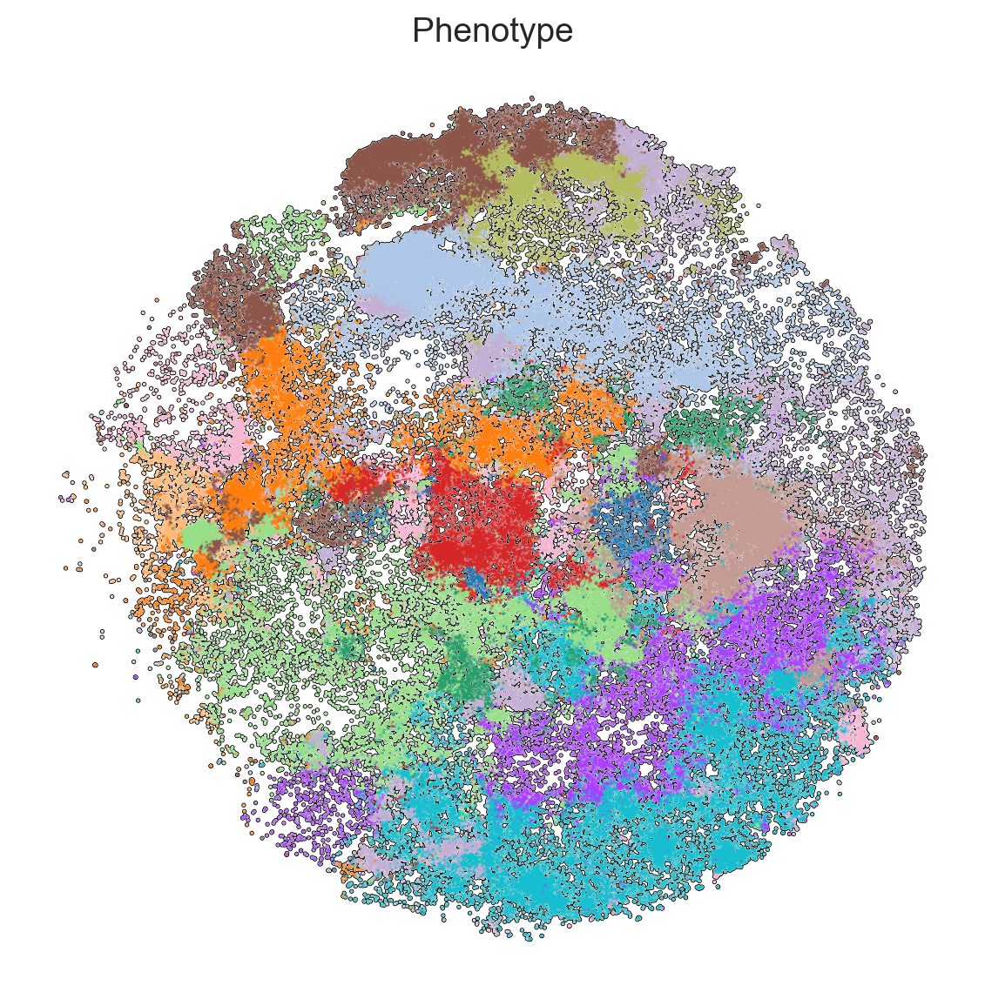

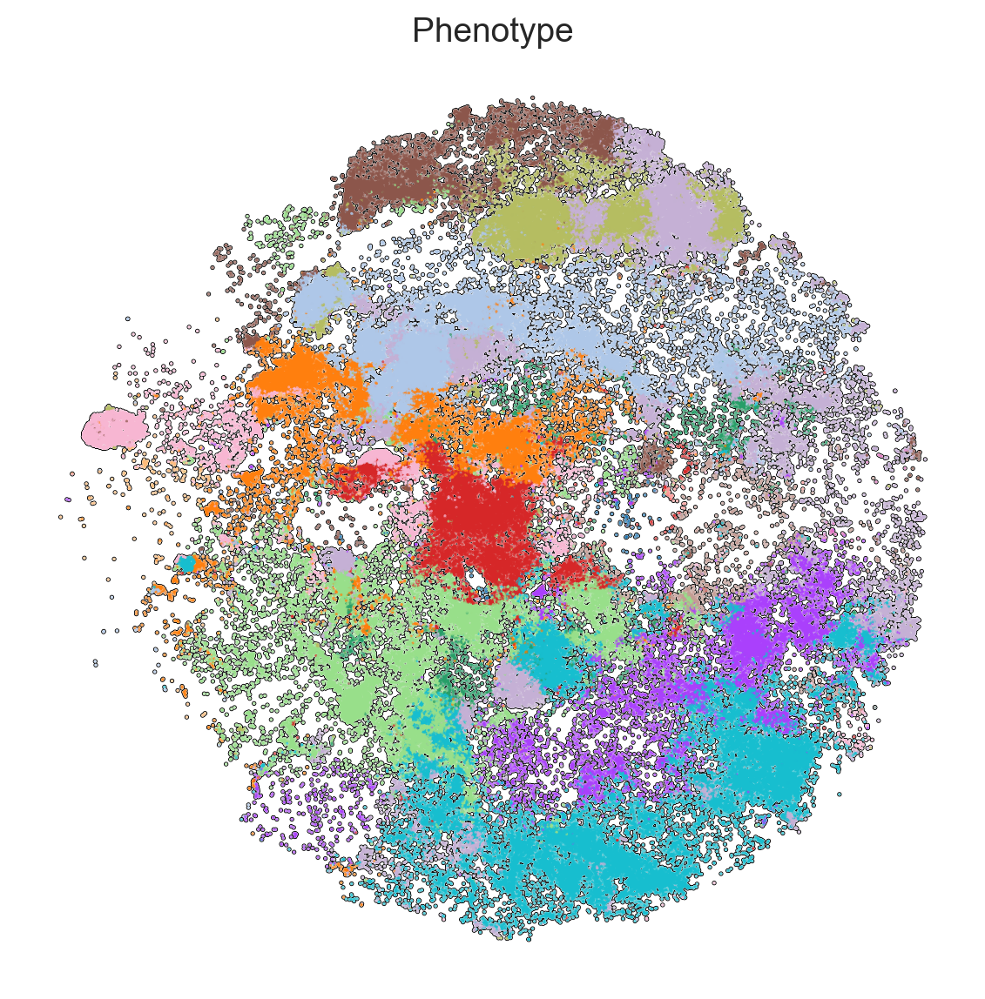

In [39]:
for donor in all_donor:
    adata_subset = adata[adata.obs.Dataset == donor,:]

    with rc_context({'figure.figsize': (7, 7), 'figure.dpi': 100}):
        fig = sc.pl.tsne(adata_subset, color=['Phenotype'], size=5, legend_loc=None, add_outline=True, frameon=False)

# Comparison Individual follicle